# Overview
The notebook shows how to extract the segmentation map for the ships, augment the images and train a simple DNN model to detect them. A few additional tweaks like balancing the ship-count out a little better have been done.

## Model Parameters
We might want to adjust these later (or do some hyperparameter optimizations)

In [1]:
BATCH_SIZE = 4
EDGE_CROP = 16
NB_EPOCHS = 5
GAUSSIAN_NOISE = 0.1
UPSAMPLE_MODE = 'SIMPLE'
# downsampling inside the network
NET_SCALING = None
# downsampling in preprocessing
IMG_SCALING = (1, 1)
# number of validation images to use
VALID_IMG_COUNT = 400
# maximum number of steps_per_epoch in training
MAX_TRAIN_STEPS = 200
AUGMENT_BRIGHTNESS = False

In [2]:
import os
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from skimage.io import imread, imsave
import matplotlib.pyplot as plt
from skimage.segmentation import mark_boundaries
from skimage.util import montage2d as montage
montage_rgb = lambda x: np.stack([montage(x[:, :, :, i]) for i in range(x.shape[3])], -1)
ship_dir = '/data2/cgp/airbus_ships/'
train_image_dir = os.path.join(ship_dir, 'train')
test_image_dir = os.path.join(ship_dir, 'test')
import gc; gc.enable() # memory is tight

from skimage.morphology import label
def multi_rle_encode(img):
    labels = label(img[:, :, 0])
    return [rle_encode(labels==k) for k in np.unique(labels[labels>0])]

# ref: https://www.kaggle.com/paulorzp/run-length-encode-and-decode
def rle_encode(img):
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    '''
    pixels = img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

def rle_decode(mask_rle, shape=(768, 768)):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return 
    Returns numpy array, 1 - mask, 0 - background
    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T  # Needed to align to RLE direction

def masks_as_image(in_mask_list):
    # Take the individual ship masks and create a single mask array for all ships
    all_masks = np.zeros((768, 768), dtype = np.int16)
    #if isinstance(in_mask_list, list):
    for mask in in_mask_list:
        if isinstance(mask, str):
            all_masks += rle_decode(mask)
    return np.expand_dims(all_masks, -1)

In [3]:
masks = pd.read_csv(os.path.join('/data2/cgp/airbus_ships/',
                                 'train_ship_segmentations_v2.csv'))
print(masks.shape[0], 'masks found')
print(masks['ImageId'].value_counts().shape[0])
masks.head()

231723 masks found
192556


,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,0001124c7.jpg,NaN
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...


# Make sure encode/decode works
Given the process
$$  RLE_0 \stackrel{Decode}{\longrightarrow} \textrm{Image}_0 \stackrel{Encode}{\longrightarrow} RLE_1 \stackrel{Decode}{\longrightarrow} \textrm{Image}_1 $$
We want to check if/that
$ \textrm{Image}_0 \stackrel{?}{=} \textrm{Image}_1 $
We could check the RLEs as well but that is more tedious. Also depending on how the objects have been labeled we might have different counts.



['139644 2 140408 6 141174 9 141942 9 142711 6 143479 2', '150423 2 151190 3 151958 3 152726 4 153495 3 154263 3', '74441 7 75207 9 75972 12 76738 14 77506 10 77517 3 78274 5 78280 4 78285 3 79042 15 79811 14 80579 14 81347 14 82115 14 82883 11 83651 11 84420 10 85188 10 85956 2 85961 2 86727 2 87493 4 88261 4 89030 3 89798 4 90566 4 91334 4 92103 3 92871 1', '95225 2 95992 5 96760 7 97527 9 98294 9 99062 9 99829 9 100596 9 101361 1 101364 9 102128 3 102132 8 102896 4 102901 6 103663 6 103671 3 104430 9 104440 2 105198 10 105209 1 105965 14 106732 14 107500 14 108267 14 108287 1 109034 14 109054 3 109802 14 109821 4 110569 14 110588 5 111336 14 111356 5 112104 14 112123 6 112871 14 112890 7 113638 14 113657 8 114406 14 114424 9 115173 14 115191 10 115940 14 115958 11 116708 14 116725 12 117475 14 117493 12 118242 14 118260 13 119010 14 119027 14 119777 14 119794 14 120544 14 120561 14 121312 14 121328 15 122079 14 122095 15 122846 14 122863 14 123614 14 123630 14 124381 14 124397 14 12

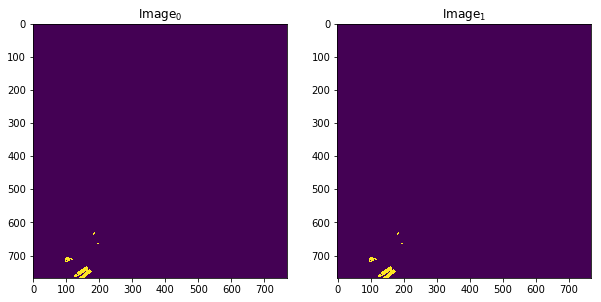

In [4]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 5))
rle_0 = masks.query('ImageId=="00021ddc3.jpg"')['EncodedPixels']
img_0 = masks_as_image(rle_0)
ax1.imshow(img_0[:, :, 0])
ax1.set_title('Image$_0$')
rle_1 = multi_rle_encode(img_0)
img_1 = masks_as_image(rle_1)
print(rle_1)
ax2.imshow(img_1[:, :, 0])
ax2.set_title('Image$_1$')
print('Check Decoding->Encoding',
      'RLE_0:', len(rle_0), '->',
      'RLE_1:', len(rle_1))

# Split into training and validation groups
We stratify by the number of boats appearing so we have nice balances in each set

,ImageId,ships,has_ship,has_ship_vec,file_size_kb
83998,6fa1b19c9.jpg,0,0.0,[0.0],117.726562
83104,6e5cefca8.jpg,1,1.0,[1.0],118.004883
145465,c16c7f601.jpg,1,1.0,[1.0],137.720703
155977,cf74afa89.jpg,0,0.0,[0.0],95.532227
86790,7345fdccd.jpg,1,1.0,[1.0],143.429688


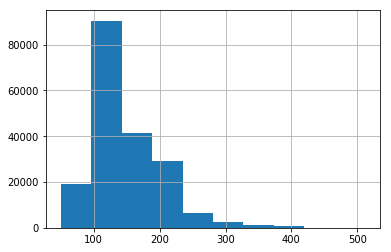

In [5]:
masks['ships'] = masks['EncodedPixels'].map(lambda c_row: 1 if isinstance(c_row, str) else 0)
unique_img_ids = masks.groupby('ImageId').agg({'ships': 'sum'}).reset_index()
unique_img_ids['has_ship'] = unique_img_ids['ships'].map(lambda x: 1.0 if x>0 else 0.0)
unique_img_ids['has_ship_vec'] = unique_img_ids['has_ship'].map(lambda x: [x])
# some files are too small/corrupt
unique_img_ids['file_size_kb'] = unique_img_ids['ImageId'].map(lambda c_img_id: 
                                                               os.stat(os.path.join(train_image_dir, 
                                                                                    c_img_id)).st_size/1024)
unique_img_ids = unique_img_ids[unique_img_ids['file_size_kb']>50] # keep only 50kb files
unique_img_ids['file_size_kb'].hist()
masks.drop(['ships'], axis=1, inplace=True)
unique_img_ids.sample(5)

In [7]:
from sklearn.model_selection import train_test_split
train_ids, valid_ids = train_test_split(unique_img_ids, 
                 test_size = 0.3, 
                 stratify = unique_img_ids['ships'])
train_df = pd.merge(masks, train_ids)
valid_df = pd.merge(masks, valid_ids)
print(train_df.shape[0], 'training masks')
print(valid_df.shape[0], 'validation masks')

161048 training masks
69034 validation masks


In [8]:
train_df

,ImageId,EncodedPixels,ships,has_ship,has_ship_vec,file_size_kb
0,00003e153.jpg,NaN,0,0.0,[0.0],128.944336
1,0001124c7.jpg,NaN,0,0.0,[0.0],76.059570
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...,1,1.0,[1.0],147.625977
3,00021ddc3.jpg,108287 1 109054 3 109821 4 110588 5 111356 5 1...,9,1.0,[1.0],242.910156
4,00021ddc3.jpg,101361 1 102128 3 102896 4 103663 6 104430 9 1...,9,1.0,[1.0],242.910156
5,00021ddc3.jpg,74441 3 75207 5 75975 5 76743 5 77511 5 78280 ...,9,1.0,[1.0],242.910156
6,00021ddc3.jpg,74444 4 75212 4 75980 4 76748 4 77517 3 78285 ...,9,1.0,[1.0],242.910156
7,00021ddc3.jpg,150423 2 151190 3 151958 3 152726 4 153495 3 1...,9,1.0,[1.0],242.910156
8,00021ddc3.jpg,139644 2 140408 6 141174 9 141942 9 142711 6 1...,9,1.0,[1.0],242.910156
9,00021ddc3.jpg,75972 3 76738 5 77506 5 78274 5 79042 6 79811 ...,9,1.0,[1.0],242.910156


### Examine Number of Ship Images
Here we examine how often ships appear and replace the ones without any ships with 0

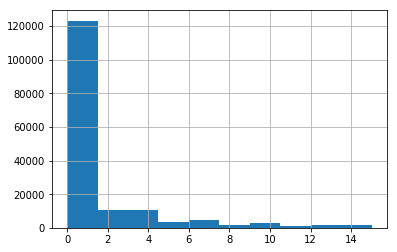

In [9]:
train_df['ships'].hist()

# Undersample Empty Images
Here we undersample the empty images to get a better balanced group with more ships to try and segment

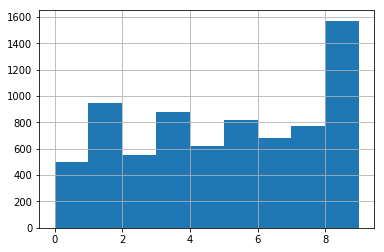

In [29]:
train_df['grouped_ship_count'] = train_df['ships'].map(lambda x: (x+1)//2).clip(0, 7)
def sample_ships(in_df, base_rep_val=1500):
    if in_df['ships'].values[0]==0:
        return in_df.sample(base_rep_val//3) # even more strongly undersample no ships
    else:
        return in_df.sample(base_rep_val, replace=(in_df.shape[0]<base_rep_val))
    
balanced_train_df = train_df.groupby('grouped_ship_count').apply(sample_ships)
balanced_train_df['ships'].hist(bins=np.arange(10))

In [62]:
tt = balanced_train_df.copy()
tt = tt.loc[tt['grouped_ship_count'] == 3]
tt.shape
tt
#row = uu.iloc[[0]]
#print(row.shape)
#print(list(row))
#row['ImageId'].values

ImageId  \
grouped_ship_count                         
3                  14822   178bec095.jpg   
                   105497  a7620beb0.jpg   
                   7632    0bf5142d0.jpg   
                   75622   7758aed5a.jpg   
                   89378   8d69a8637.jpg   
                   137623  dadac0e64.jpg   
                   157266  f9f6f3ce2.jpg   
                   31916   330d5b8a9.jpg   
                   85158   86b627cf1.jpg   
                   54118   55dcfc53e.jpg   
                   18211   1d229447c.jpg   
                   16986   1b1d2cb5b.jpg   
                   115227  b6a7b45a6.jpg   
                   13144   14be61b87.jpg   
                   31310   3220a767d.jpg   
                   128632  cc26696be.jpg   
                   61830   6206a7b0c.jpg   
                   76806   794ad1805.jpg   
                   144914  e67a886aa.jpg   
                   3973    064121a97.jpg   
                   114817  b5f98f654.jpg   
                   137268  da3f309b1.jpg   
                   42539   43d0f84a5.jpg   
                   55769   58509dc05.jpg   
                   152857  f2f476d8d.jpg   
                   28413   2d6194710.jpg   
                   83171   838305735.jpg   
                   88514   8c28fe108.jpg   
                   72173   7231c10ba.jpg   
                   55785   58594a982.jpg   
...                                  ...   
                   21859   22f8ace63.jpg   
                   121749  c127fdb25.jpg   
                   9712    0f4a0b06c.jpg   
                   123404  c3becec89.jpg   
                   153343  f3b41e1f7.jpg   
                   20635   211190dda.jpg   
                   129441  cd744f14c.jpg   
                   76002   77fa5bcdb.jpg   
                   3721    05d523c71.jpg   
                   94128   9515a948d.jpg   
                   75487   7720cc64b.jpg   
                   29508   2f265b268.jpg   
                   156694  f90b1931a.jpg   
                   18699   1defabda3.jpg   
                   14703   175f0bc4e.jpg   
                   47395   4b6dfbe84.jpg   
                   12903   1462e9f69.jpg   
                   141413  e0f862e11.jpg   
                   40006   3fdcf9308.jpg   
                   20186   205cd2239.jpg   
                   43428   450c64160.jpg   
                   147542  eac759ca6.jpg   
                   106522  a8f4b2238.jpg   
                   97225   9a1c6fd32.jpg   
                   45133   47c755785.jpg   
                   22282   2397af26b.jpg   
                   33630   35e2983d0.jpg   
                   65489   67d0e0602.jpg   
                   16854   1aeb7d945.jpg   
                   153825  f47b06cd4.jpg   

                                                               EncodedPixels  \
grouped_ship_count                                                             
3                  14822   25263 2 26028 5 26794 8 27559 11 28324 14 2909...   
                   105497  150667 2 151433 4 152199 7 152964 10 153730 13...   
                   7632    318009 16 318777 47 319545 79 320313 110 32108...   
                   75622   413594 3 414356 9 415119 14 415882 19 416644 2...   
                   89378   543776 9 544544 9 545312 9 546080 9 546848 9 5...   
                   137623  195836 3 196604 5 197372 5 198140 5 198908 5 1...   
                   157266  93270 1 94037 3 94805 5 95572 7 96339 9 97107 ...   
                   31916   220899 1 221666 4 222434 6 223201 9 223969 10 ...   
                   85158   162633 2 163399 4 164165 7 164933 7 165699 10 ...   
                   54118   358693 1 359460 3 360227 5 360994 7 361761 9 3...   
                   18211   433068 3 433836 7 434603 13 435371 17 436139 2...   
                   16986   407952 2 408718 4 409484 7 410250 9 411016 12 ...   
                   115227  408414 2 409180 4 409946 7 410711 10 411477 13...   
                   13144   462772 2 463537 5 464303 8 465068

# Decode all the RLEs into Images
We make a generator to produce batches of images

In [9]:
def make_image_gen(in_df, batch_size = BATCH_SIZE):
    all_batches = list(in_df.groupby('ImageId'))
    out_rgb = []
    out_mask = []
    while True:
        np.random.shuffle(all_batches)
        for c_img_id, c_masks in all_batches:
            rgb_path = os.path.join(train_image_dir, c_img_id)
            c_img = imread(rgb_path)
            c_mask = masks_as_image(c_masks['EncodedPixels'].values)
            if IMG_SCALING is not None:
                c_img = c_img[::IMG_SCALING[0], ::IMG_SCALING[1]]
                c_mask = c_mask[::IMG_SCALING[0], ::IMG_SCALING[1]]
            out_rgb += [c_img]
            out_mask += [c_mask]
            if len(out_rgb)>=batch_size:
                yield np.stack(out_rgb, 0)/255.0, np.stack(out_mask, 0)
                out_rgb, out_mask=[], []

In [60]:
num_training_examples = 200
train_x = np.zeros((num_training_examples, 768, 768, 3))
train_y = np.zeros((num_training_examples, 768, 768, 1))
for idx in range(num_training_examples):
    row = tt.iloc[[idx]]
    rgb_path = os.path.join(train_image_dir, row['ImageId'].values[0])
    c_img = imread(rgb_path)
    c_mask = masks_as_image(row['EncodedPixels'].values)
    train_x[idx, :, :, :] = c_img / 255.0
    train_y[idx, :, :, :] = c_mask

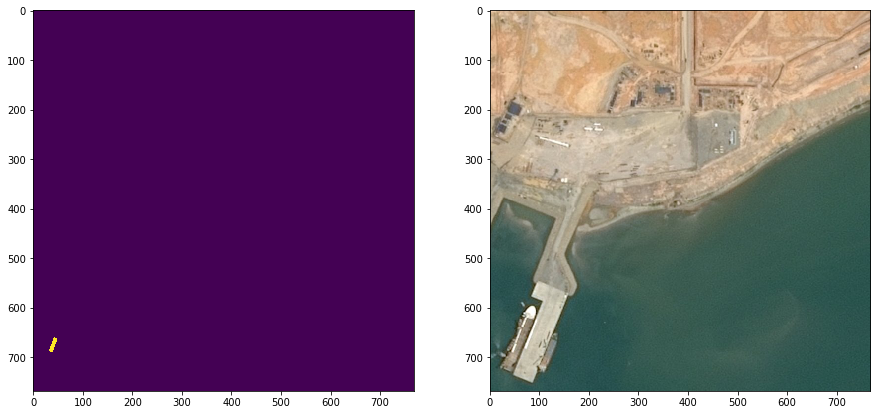

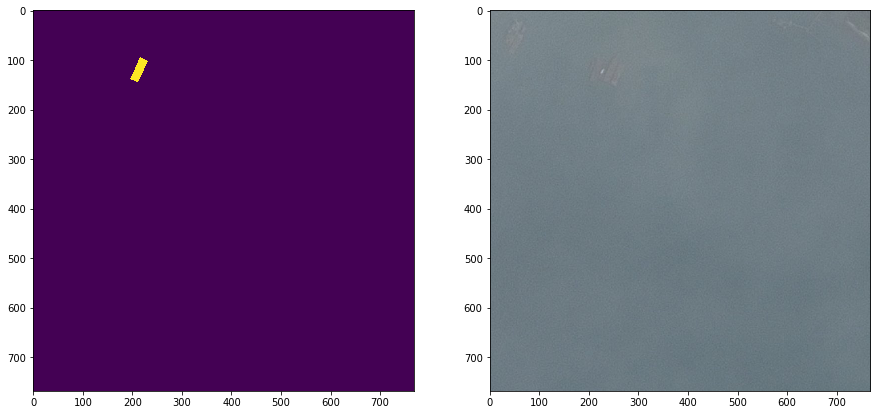

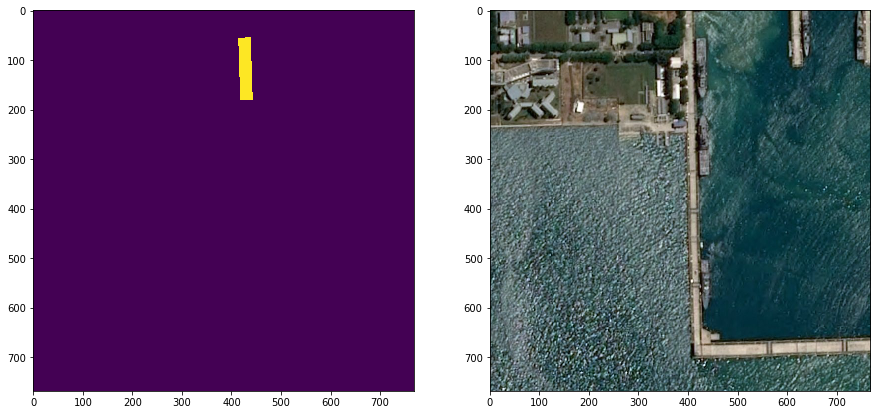

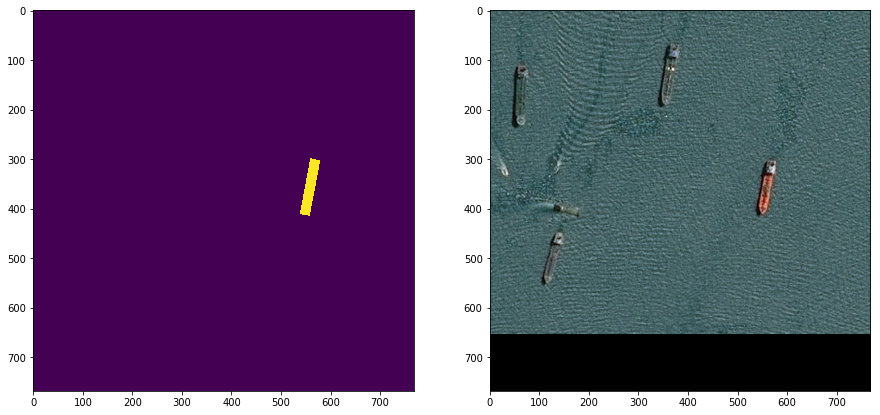

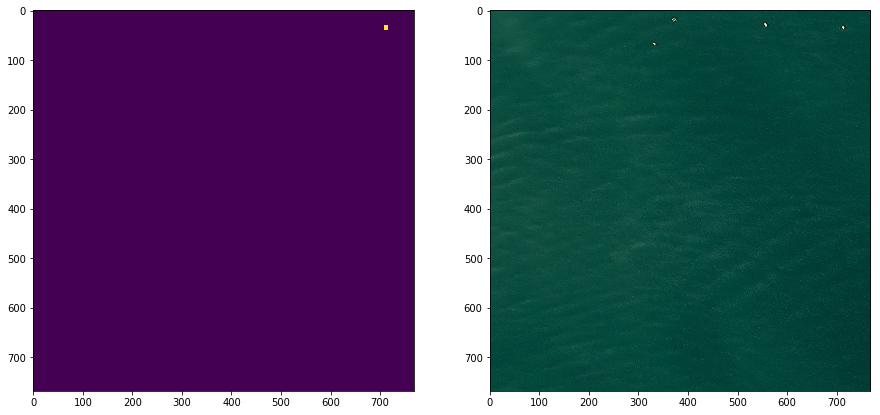

...

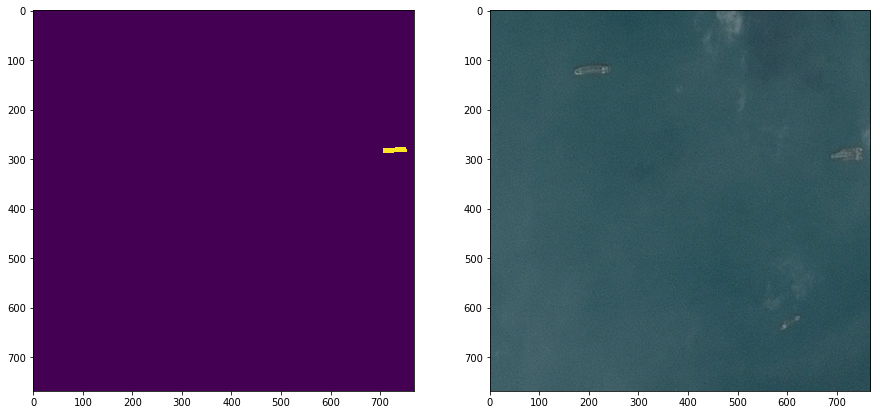

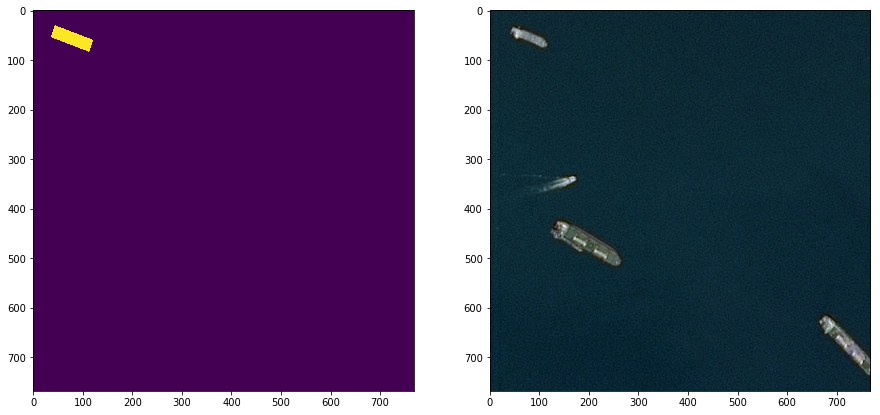

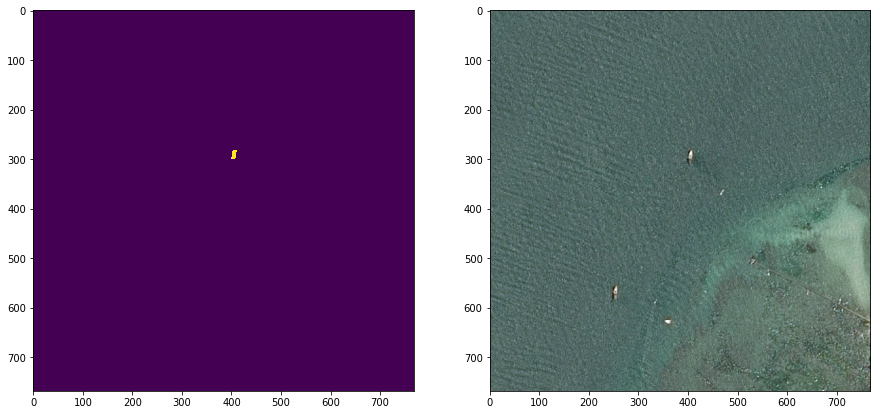

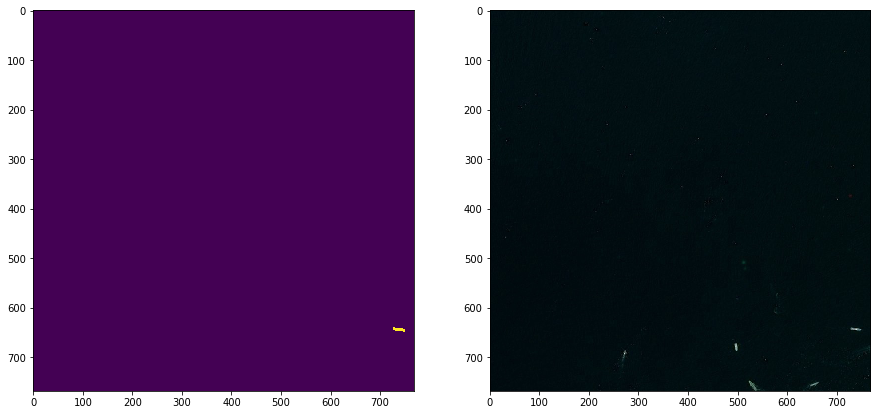

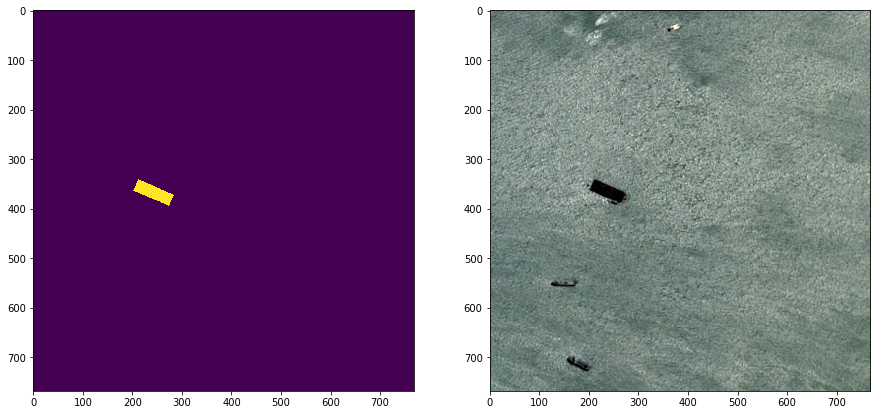

In [61]:
for idx in range(0, 20):
    fig, m_axs = plt.subplots(1, 2, figsize=(15, 15))  
    m_axs[0].imshow(train_y[idx, :, :, 0])
    m_axs[1].imshow(train_x[idx, :, :, :])

/home/cpadwick/code/airbus_ships/env/lib/python3.5/site-packages/skimage/util/_montage.py:142: skimage_deprecation: Function ``montage2d`` is deprecated and will be removed in version 0.15. Use ``montage`` instead.
  def montage2d(arr_in, fill='mean', rescale_intensity=False, grid_shape=None,
/home/cpadwick/code/airbus_ships/env/lib/python3.5/site-packages/skimage/util/_montage.py:142: skimage_deprecation: Function ``montage2d`` is deprecated and will be removed in version 0.15. Use ``montage`` instead.
  def montage2d(arr_in, fill='mean', rescale_intensity=False, grid_shape=None,
/home/cpadwick/code/airbus_ships/env/lib/python3.5/site-packages/skimage/util/_montage.py:142: skimage_deprecation: Function ``montage2d`` is deprecated and will be removed in version 0.15. Use ``montage`` instead.
  def montage2d(arr_in, fill='mean', rescale_intensity=False, grid_shape=None,
/home/cpadwick/code/airbus_ships/env/lib/python3.5/site-packages/skimage/util/_montage.py:142: skimage_deprecation: Fu

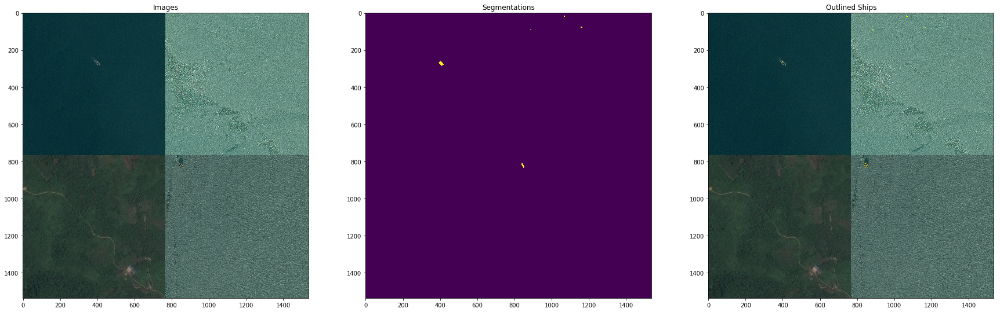

In [11]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (30, 10))
batch_rgb = montage_rgb(train_x)
batch_seg = montage(train_y[:, :, :, 0])
ax1.imshow(batch_rgb)
ax1.set_title('Images')
ax2.imshow(batch_seg)
ax2.set_title('Segmentations')
ax3.imshow(mark_boundaries(batch_rgb, 
                           batch_seg.astype(int)))
ax3.set_title('Outlined Ships')
fig.savefig('overview.png')

# Make the Validation Set

In [12]:
valid_x, valid_y = next(make_image_gen(valid_df, VALID_IMG_COUNT))
print(valid_x.shape, valid_y.shape)

(400, 768, 768, 3) (400, 768, 768, 1)


# Augment Data

In [13]:
from keras.preprocessing.image import ImageDataGenerator
dg_args = dict(featurewise_center = False, 
                  samplewise_center = False,
                  rotation_range = 15, 
                  width_shift_range = 0.1, 
                  height_shift_range = 0.1, 
                  shear_range = 0.01,
                  zoom_range = [0.9, 1.25],  
                  horizontal_flip = True, 
                  vertical_flip = True,
                  fill_mode = 'reflect',
                   data_format = 'channels_last')
# brightness can be problematic since it seems to change the labels differently from the images 
if AUGMENT_BRIGHTNESS:
    dg_args[' brightness_range'] = [0.5, 1.5]
image_gen = ImageDataGenerator(**dg_args)

if AUGMENT_BRIGHTNESS:
    dg_args.pop('brightness_range')
label_gen = ImageDataGenerator(**dg_args)

def create_aug_gen(in_gen, seed = None):
    np.random.seed(seed if seed is not None else np.random.choice(range(9999)))
    for in_x, in_y in in_gen:
        seed = np.random.choice(range(9999))
        # keep the seeds syncronized otherwise the augmentation to the images is different from the masks
        g_x = image_gen.flow(255*in_x, 
                             batch_size = in_x.shape[0], 
                             seed = seed, 
                             shuffle=True)
        g_y = label_gen.flow(in_y, 
                             batch_size = in_x.shape[0], 
                             seed = seed, 
                             shuffle=True)

        yield next(g_x)/255.0, next(g_y)

Using TensorFlow backend.


x (4, 768, 768, 3) float32 0.0 1.0
y (4, 768, 768, 1) float32 0.0 1.0


/home/cpadwick/code/airbus_ships/env/lib/python3.5/site-packages/skimage/util/_montage.py:142: skimage_deprecation: Function ``montage2d`` is deprecated and will be removed in version 0.15. Use ``montage`` instead.
  def montage2d(arr_in, fill='mean', rescale_intensity=False, grid_shape=None,
/home/cpadwick/code/airbus_ships/env/lib/python3.5/site-packages/skimage/util/_montage.py:142: skimage_deprecation: Function ``montage2d`` is deprecated and will be removed in version 0.15. Use ``montage`` instead.
  def montage2d(arr_in, fill='mean', rescale_intensity=False, grid_shape=None,
/home/cpadwick/code/airbus_ships/env/lib/python3.5/site-packages/skimage/util/_montage.py:142: skimage_deprecation: Function ``montage2d`` is deprecated and will be removed in version 0.15. Use ``montage`` instead.
  def montage2d(arr_in, fill='mean', rescale_intensity=False, grid_shape=None,
/home/cpadwick/code/airbus_ships/env/lib/python3.5/site-packages/skimage/util/_montage.py:142: skimage_deprecation: Fu

Text(0.5, 1.0, 'ships')

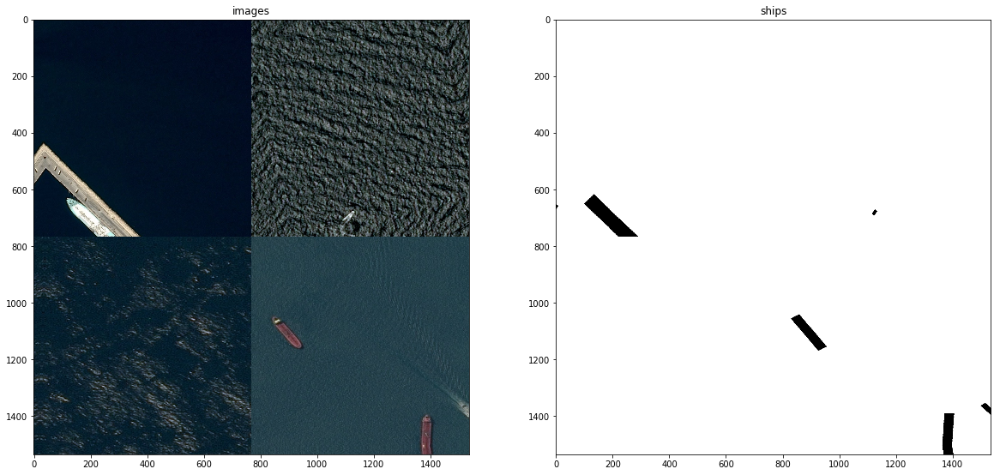

In [14]:
cur_gen = create_aug_gen(train_gen)
t_x, t_y = next(cur_gen)
print('x', t_x.shape, t_x.dtype, t_x.min(), t_x.max())
print('y', t_y.shape, t_y.dtype, t_y.min(), t_y.max())
# only keep first 9 samples to examine in detail
t_x = t_x[:9]
t_y = t_y[:9]
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (20, 10))
ax1.imshow(montage_rgb(t_x), cmap='gray')
ax1.set_title('images')
ax2.imshow(montage(t_y[:, :, :, 0]), cmap='gray_r')
ax2.set_title('ships')

In [15]:
gc.collect()

0

# Build a Model
Here we use a slight deviation on the U-Net standard

In [16]:
from keras import models, layers
# Build U-Net model
def upsample_conv(filters, kernel_size, strides, padding):
    return layers.Conv2DTranspose(filters, kernel_size, strides=strides, padding=padding)
def upsample_simple(filters, kernel_size, strides, padding):
    return layers.UpSampling2D(strides)

if UPSAMPLE_MODE=='DECONV':
    upsample=upsample_conv
else:
    upsample=upsample_simple
    
input_img = layers.Input(t_x.shape[1:], name = 'RGB_Input')
pp_in_layer = input_img
if NET_SCALING is not None:
    pp_in_layer = layers.AvgPool2D(NET_SCALING)(pp_in_layer)
    
pp_in_layer = layers.GaussianNoise(GAUSSIAN_NOISE)(pp_in_layer)
pp_in_layer = layers.BatchNormalization()(pp_in_layer)

c1 = layers.Conv2D(8, (3, 3), activation='relu', padding='same') (pp_in_layer)
c1 = layers.Conv2D(8, (3, 3), activation='relu', padding='same') (c1)
p1 = layers.MaxPooling2D((2, 2)) (c1)

c2 = layers.Conv2D(16, (3, 3), activation='relu', padding='same') (p1)
c2 = layers.Conv2D(16, (3, 3), activation='relu', padding='same') (c2)
p2 = layers.MaxPooling2D((2, 2)) (c2)

c3 = layers.Conv2D(32, (3, 3), activation='relu', padding='same') (p2)
c3 = layers.Conv2D(32, (3, 3), activation='relu', padding='same') (c3)
p3 = layers.MaxPooling2D((2, 2)) (c3)

c4 = layers.Conv2D(64, (3, 3), activation='relu', padding='same') (p3)
c4 = layers.Conv2D(64, (3, 3), activation='relu', padding='same') (c4)
p4 = layers.MaxPooling2D(pool_size=(2, 2)) (c4)


c5 = layers.Conv2D(128, (3, 3), activation='relu', padding='same') (p4)
c5 = layers.Conv2D(128, (3, 3), activation='relu', padding='same') (c5)

u6 = upsample(64, (2, 2), strides=(2, 2), padding='same') (c5)
u6 = layers.concatenate([u6, c4])
c6 = layers.Conv2D(64, (3, 3), activation='relu', padding='same') (u6)
c6 = layers.Conv2D(64, (3, 3), activation='relu', padding='same') (c6)

u7 = upsample(32, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = layers.concatenate([u7, c3])
c7 = layers.Conv2D(32, (3, 3), activation='relu', padding='same') (u7)
c7 = layers.Conv2D(32, (3, 3), activation='relu', padding='same') (c7)

u8 = upsample(16, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = layers.concatenate([u8, c2])
c8 = layers.Conv2D(16, (3, 3), activation='relu', padding='same') (u8)
c8 = layers.Conv2D(16, (3, 3), activation='relu', padding='same') (c8)

u9 = upsample(8, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = layers.concatenate([u9, c1], axis=3)
c9 = layers.Conv2D(8, (3, 3), activation='relu', padding='same') (u9)
c9 = layers.Conv2D(8, (3, 3), activation='relu', padding='same') (c9)

d = layers.Conv2D(1, (1, 1), activation='sigmoid') (c9)
d = layers.Cropping2D((EDGE_CROP, EDGE_CROP))(d)
d = layers.ZeroPadding2D((EDGE_CROP, EDGE_CROP))(d)
if NET_SCALING is not None:
    d = layers.UpSampling2D(NET_SCALING)(d)

seg_model = models.Model(inputs=[input_img], outputs=[d])
seg_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
RGB_Input (InputLayer)          (None, 768, 768, 3)  0                                            
__________________________________________________________________________________________________
gaussian_noise_1 (GaussianNoise (None, 768, 768, 3)  0           RGB_Input[0][0]                  
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 768, 768, 3)  12          gaussian_noise_1[0][0]           
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 768, 768, 8)  224         batch_normalization_1[0][0]      
__________________________________________________________________________________________________
conv2d_2 (

In [29]:
import keras.backend as K
from keras.optimizers import Adam
from keras.losses import binary_crossentropy
def dice_coef(y_true, y_pred, smooth=1):
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
    return K.mean( (2. * intersection + smooth) / (union + smooth), axis=0)
def dice_p_bce(in_gt, in_pred):
    return 1e-3*binary_crossentropy(in_gt, in_pred) - dice_coef(in_gt, in_pred)
def true_positive_rate(y_true, y_pred):
    return K.sum(K.flatten(y_true)*K.flatten(K.round(y_pred)))/K.sum(y_true)
seg_model.compile(optimizer=Adam(1e-2, decay=1e-6), loss='mean_squared_error', metrics=[dice_coef, 'binary_accuracy', true_positive_rate])

In [30]:
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
weight_path="{}_weights.best.hdf5".format('seg_model')

checkpoint = ModelCheckpoint(weight_path, monitor='val_dice_coef', verbose=1, 
                             save_best_only=True, mode='max', save_weights_only = True)

reduceLROnPlat = ReduceLROnPlateau(monitor='val_dice_coef', factor=0.5, 
                                   patience=3, 
                                   verbose=1, mode='max', epsilon=0.0001, cooldown=2, min_lr=1e-6)
early = EarlyStopping(monitor="val_dice_coef", 
                      mode="max", 
                      patience=15) # probably needs to be more patient, but kaggle time is limited
callbacks_list = [checkpoint, early, reduceLROnPlat]


In [31]:
step_count = min(MAX_TRAIN_STEPS, balanced_train_df.shape[0]//BATCH_SIZE)
aug_gen = create_aug_gen(make_image_gen(balanced_train_df))
no_aug_gen = make_image_gen(balanced_train_df)
loss_history = [seg_model.fit_generator(no_aug_gen, 
                             steps_per_epoch=step_count, 
                             epochs=NB_EPOCHS, 
                             validation_data=(valid_x, valid_y),
                             callbacks=callbacks_list,
                            workers=1 # the generator is not very thread safe
                                       )]

Epoch 1/5
200/200 [==============================] - 92s 461ms/step - loss: 0.0118 - dice_coef: 0.2018 - binary_accuracy: 0.9955 - true_positive_rate: 0.0000e+00 - val_loss: 0.0013 - val_dice_coef: 0.4585 - val_binary_accuracy: 0.9987 - val_true_positive_rate: nan

Epoch 00001: val_dice_coef improved from -inf to 0.45853, saving model to seg_model_weights.best.hdf5
Epoch 2/5
200/200 [==============================] - 83s 413ms/step - loss: 0.0135 - dice_coef: 0.1919 - binary_accuracy: 0.9959 - true_positive_rate: 0.0000e+00 - val_loss: 0.0013 - val_dice_coef: 0.4656 - val_binary_accuracy: 0.9987 - val_true_positive_rate: nan

Epoch 00002: val_dice_coef improved from 0.45853 to 0.46561, saving model to seg_model_weights.best.hdf5
Epoch 3/5
200/200 [==============================] - 82s 409ms/step - loss: 0.0185 - dice_coef: 0.1870 - binary_accuracy: 0.9956 - true_positive_rate: 0.0000e+00 - val_loss: 0.0013 - val_dice_coef: 0.4637 - val_binary_accuracy: 0.9987 - val_true_positive_rate: 

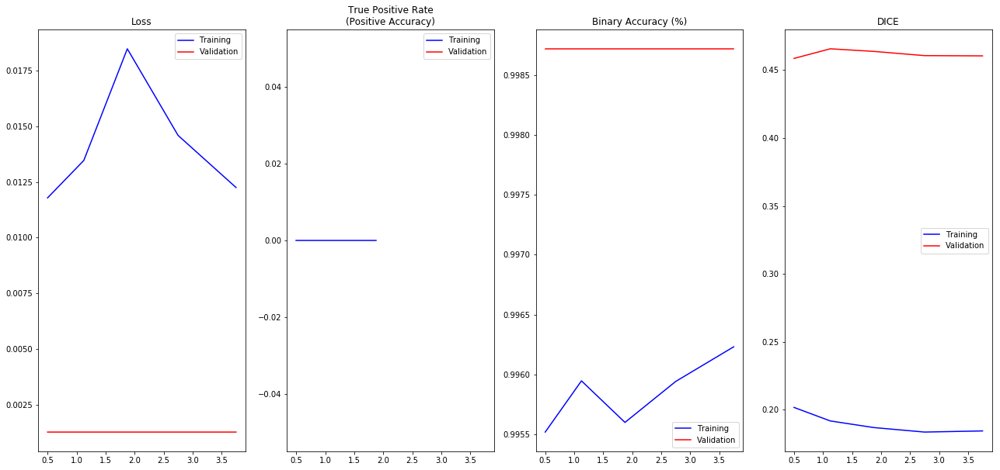

In [32]:
def show_loss(loss_history):
    epich = np.cumsum(np.concatenate(
        [np.linspace(0.5, 1, len(mh.epoch)) for mh in loss_history]))
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(22, 10))
    _ = ax1.plot(epich,
                 np.concatenate([mh.history['loss'] for mh in loss_history]),
                 'b-',
                 epich, np.concatenate(
            [mh.history['val_loss'] for mh in loss_history]), 'r-')
    ax1.legend(['Training', 'Validation'])
    ax1.set_title('Loss')

    _ = ax2.plot(epich, np.concatenate(
        [mh.history['true_positive_rate'] for mh in loss_history]), 'b-',
                     epich, np.concatenate(
            [mh.history['val_true_positive_rate'] for mh in loss_history]),
                     'r-')
    ax2.legend(['Training', 'Validation'])
    ax2.set_title('True Positive Rate\n(Positive Accuracy)')
    
    _ = ax3.plot(epich, np.concatenate(
        [mh.history['binary_accuracy'] for mh in loss_history]), 'b-',
                     epich, np.concatenate(
            [mh.history['val_binary_accuracy'] for mh in loss_history]),
                     'r-')
    ax3.legend(['Training', 'Validation'])
    ax3.set_title('Binary Accuracy (%)')
    
    _ = ax4.plot(epich, np.concatenate(
        [mh.history['dice_coef'] for mh in loss_history]), 'b-',
                     epich, np.concatenate(
            [mh.history['val_dice_coef'] for mh in loss_history]),
                     'r-')
    ax4.legend(['Training', 'Validation'])
    ax4.set_title('DICE')

show_loss(loss_history)

In [33]:
seg_model.load_weights(weight_path)
seg_model.save('seg_model.h5')

In [34]:
pred_y = seg_model.predict(valid_x)
print(pred_y.shape, pred_y.min(), pred_y.max(), pred_y.mean())

(400, 768, 768, 1) 0.0 0.03453458 7.5734875e-05


NameError: name 'img' is not defined

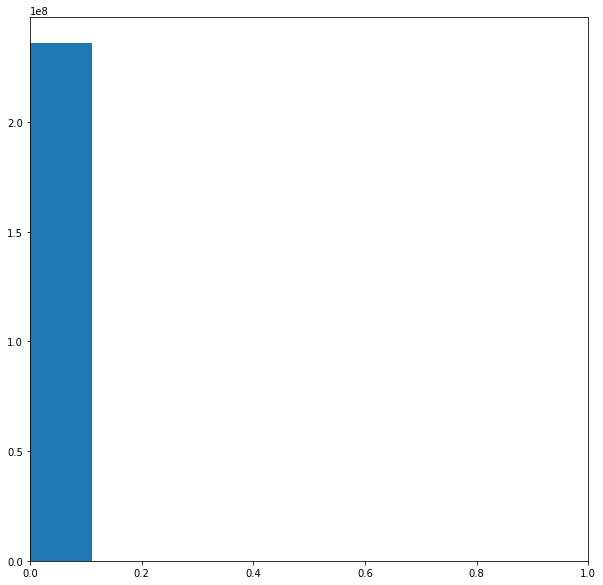

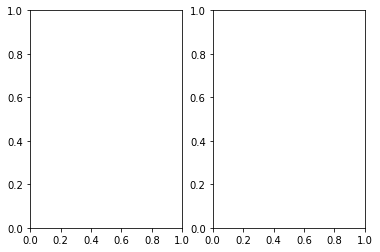

In [35]:
fig, ax = plt.subplots(1, 1, figsize = (10, 10))
ax.hist(pred_y.ravel(), np.linspace(0, 1, 10))
ax.set_xlim(0, 1)
fig, m_axs = plt.subplots(1, 2)  
m_axs[0].imshow(img)
ax.set_yscale('log', nonposy='clip')

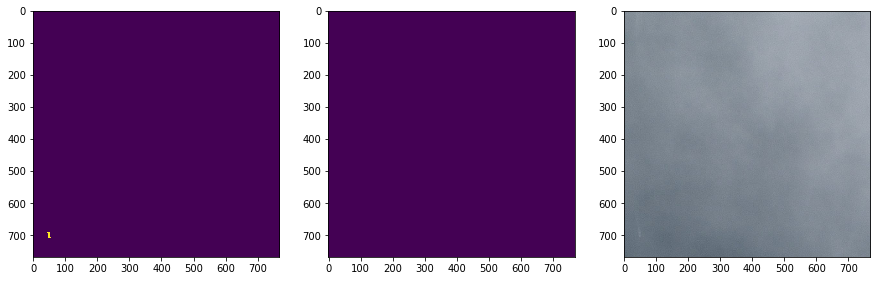

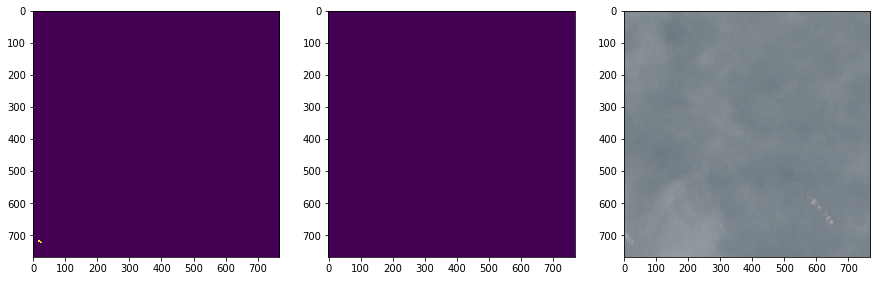

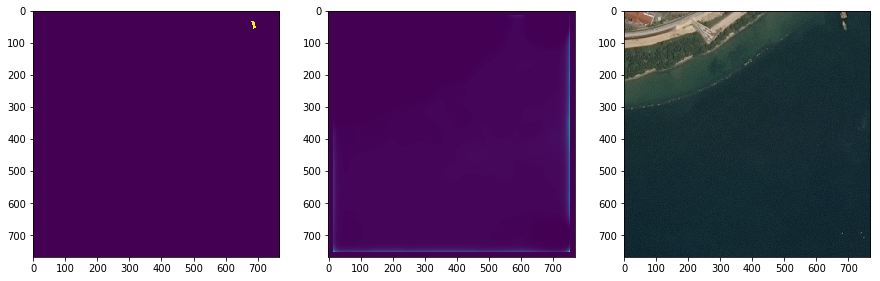

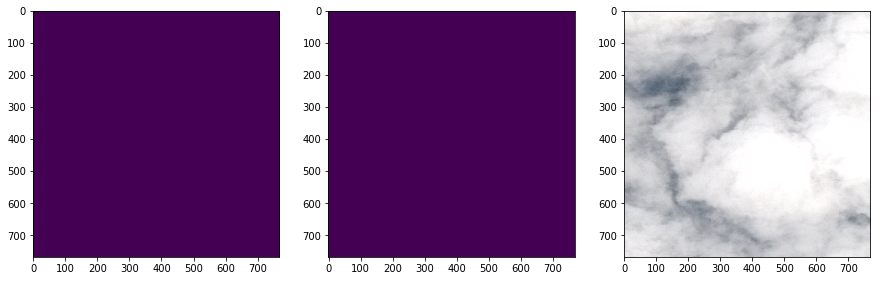

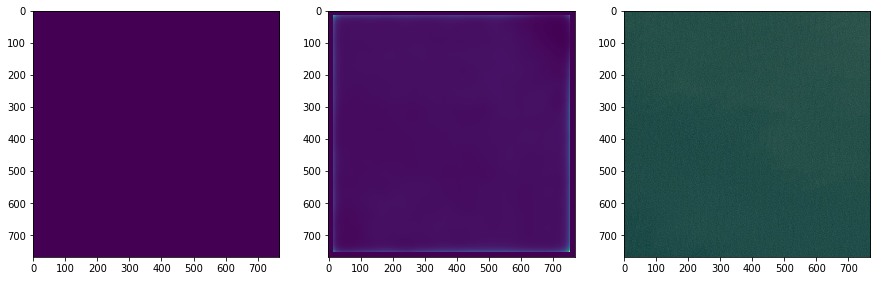

...

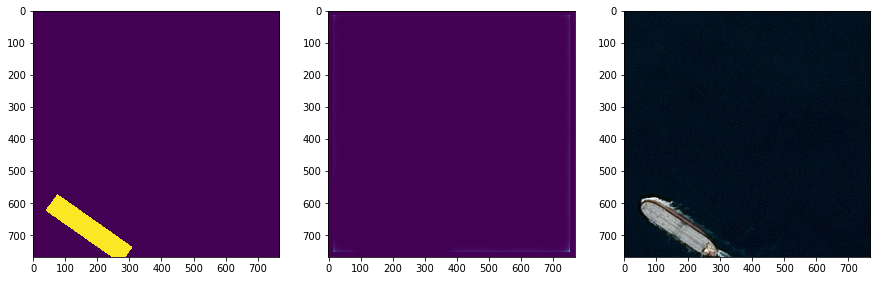

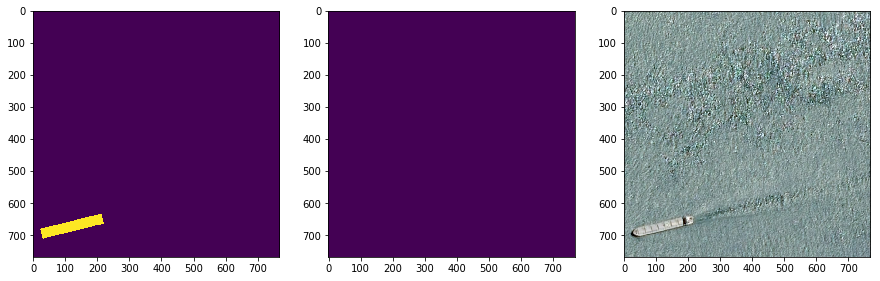

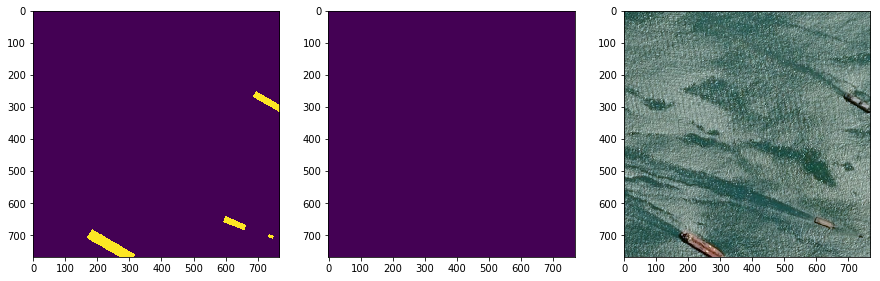

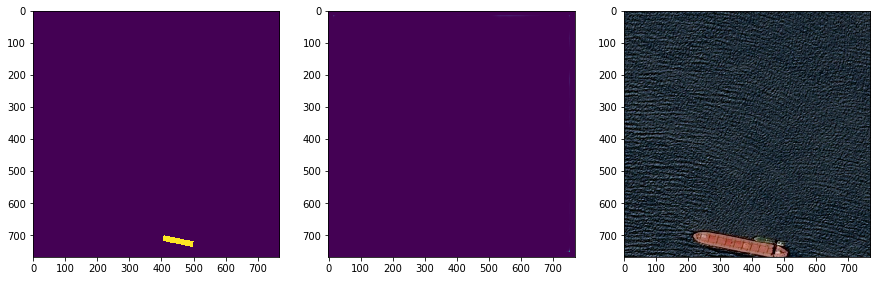

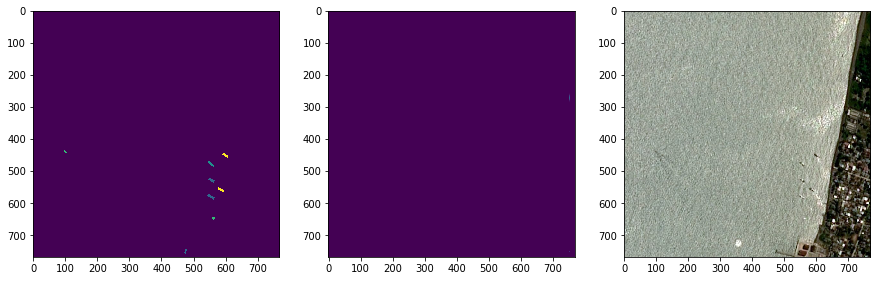

In [36]:
train_gen = make_image_gen(balanced_train_df)

for idx in range(0, 20): 
    train_x, train_y = next(train_gen)
    model_pred = seg_model.predict(train_x)
    fig, m_axs = plt.subplots(1, 3, figsize=(15, 15))  
    m_axs[0].imshow(train_y[0, :, :, 0])
    m_axs[1].imshow(model_pred[0, :, :, 0])
    m_axs[2].imshow(train_x[0, :, :, :])

In [ ]:
for idx in range(0, 100): 
    fig, m_axs = plt.subplots(1, 3, figsize=(15, 15))  
    m_axs[0].imshow(valid_y[idx, :, :, 0])
    m_axs[1].imshow(pred_y[idx, :, :, 0])
    m_axs[2].imshow(valid_x[idx, :, :, :])

# Prepare Full Resolution Model
Here we account for the scaling so everything can happen in the model itself

In [ ]:
if IMG_SCALING is not None:
    fullres_model = models.Sequential()
    fullres_model.add(layers.AvgPool2D(IMG_SCALING, input_shape = (None, None, 3)))
    fullres_model.add(seg_model)
    fullres_model.add(layers.UpSampling2D(IMG_SCALING))
else:
    fullres_model = seg_model
fullres_model.save('fullres_model.h5')

# Run the test data

In [ ]:
test_paths = os.listdir(test_image_dir)
print(len(test_paths), 'test images found')

In [ ]:
for imgpath in test_image_dir[0:50]:
    c_img = imread(c_path)
    first_img = np.expand_dims(c_img, 0)/255.0
    first_seg = fullres_model.predict(first_img)
    base, ext = os.path.splitext(os.path.basename(imgpath))
    outfile = os.path.join(test_image_dir, base + '_pred.png')
    imsave(outfile, first_seg[0, :, :,0])

In [ ]:
fig, m_axs = plt.subplots(20, 2)
fig.set_size_inches(50, 50)
[c_ax.axis('off') for c_ax in m_axs.flatten()]
for (ax1, ax2), c_img_name in zip(m_axs, test_paths):
    c_path = os.path.join(test_image_dir, c_img_name)
    c_img = imread(c_path)
    first_img = np.expand_dims(c_img, 0)/255.0
    first_seg = fullres_model.predict(first_img)
    ax1.imshow(first_img[0])
    ax1.set_title('Image')
    ax2.imshow(first_seg[0, :, :, 0], vmin = 0, vmax = 1)
    ax2.set_title('Prediction')
fig.savefig('test_predictions.png')

# Submission
Since gneerating the submission takes a long time and quite a bit of memory we run it in a seperate kernel located at https://www.kaggle.com/kmader/from-trained-u-net-to-submission-part-2 
That kernel takes the model saved in this kernel and applies it to all the test data